# Pipeline

See [usage](https://among.github.io/fusus/use/).

See [example](https://github.com/among/fusus/blob/master/example/doExample.ipynb).

How to read this notebook:

1.  *best experience*
    get this repository on your computer and run `jupyter lab`.
    Also install the table of contents extension in Jupyter Lab, since this is a lengthy notebook
    You can run the code cells now.
1.  *good reading experience*
    read it on [NbViewer](https://nbviewer.jupyter.org/github/among/fusus/blob/master/example/doExample.ipynb)
1.  *suboptimal*
    read it directly on [GitHub](https://github.com/among/fusus/blob/master/example/doExample.ipynb)
    (long time to load)

# The beginning

Enable autoloading of changed code.

Change the directory to where this notebook resides on disk, i.e. near the book's scanned pages directory.

In [1]:
%load_ext autoreload
%autoreload 2
!cd `pwd`

Import the pipeline package.

See [install](https://among.github.io/fusus/about/install.html).

In [2]:
from pipeline.book import Book

Initialize the processing line.

In [3]:
B = Book()

# Settings

Learn how to show and edit settings.

Here is the
[documentation](https://among.github.io/fusus/parameters.html)
of all customizable settings.

Inspect the settings, first a single setting, then two, then all.

In [4]:
B.showSettings(params="blurX")

blurX                = 31


In [5]:
B.showSettings(params="blurX,blurY")

blurX                = 31
blurY                = 11


In [6]:
B.showSettings()

accuracy             = 0.8
bandBroad            = (-15, 10)
bandHigh             = (10, 30)
bandInter            = (5, 5)
bandLow              = (-10, -10)
bandMain             = (0, 0)
bandMid              = (10, -5)
blurX                = 31
blurY                = 11
boxBorder            = 3
connectBorder        = 4
connectRatio         = 0.1
connectThreshold     = 40000
inDir                = in
interDir             = inter
marginThresholdX     = 1
marginThresholdY     = 5
marksDir             = marks
maxHits              = 5000
outDir               = out
skewBorder           = 30


Change settings.

In [7]:
B.configure(blurX=11, blurY=3)
B.showSettings(params="blurX,blurY")

blurX                = 11
blurY                = 3


Reset individual parameters:

In [8]:
B.configure(blurX=None)
B.showSettings(params="blurX,blurY")

blurX                = 31
blurY                = 3


Reset all parameters:

In [9]:
B.configure(reset=True)
B.showSettings(params="blurX,blurY")

blurX                = 31
blurY                = 11


# Bands

Bands are regions where we look for spots to wipe clean.

See [usage](https://among.github.io/fusus/about/use.html).

Here they are:

In [10]:
B.availableBands()

Available bands and their offsets
	«broad»   : top= -15, bottom=  10
	«high»    : top=  10, bottom=  30
	«inter»   : top=   5, bottom=   5
	«low»     : top= -10, bottom= -10
	«main»    : top=   0, bottom=   0
	«mid»     : top=  10, bottom=  -5


## How are the bands computed?

The `main` band is computed directly from the histogram in such a way that almost
all ink of a line falls in it.

The `broad` band is a wider variant of `main`.

The `mid` band is a narrower variant of `main`.

The `inter` band is computed from the histogram in such a way that almost all the
interline space falls in it.

The `high` band is variant of `inter`, so that the upper interlinear space falls in it.

The `low` band is variant of `inter`, so that the lower interlinear space falls in it.

The `top` and `bottom` numbers show how much the top and bottom boundaries have been shifted
with respect to the band they are based on.

A negative value shifts up, a positive value shifts down.

## Customizing bands

If you want to shift the boundaries of the bands,
change the offsets:

Suppose you want to widen the `mid`  band, then you can proceed as follows:

In [11]:
B.configure(bandMid=(20,20))
B.showSettings(params="bandMid")
B.availableBands()

bandMid              = (20, 20)
Available bands and their offsets
	«broad»   : top= -15, bottom=  10
	«high»    : top=  10, bottom=  30
	«inter»   : top=   5, bottom=   5
	«low»     : top= -10, bottom= -10
	«main»    : top=   0, bottom=   0
	«mid»     : top=  20, bottom=  20


You can change back to the default:

In [12]:
B.configure(bandMid=None)
B.showSettings(params="bandMid")
B.availableBands()

bandMid              = (10, -5)
Available bands and their offsets
	«broad»   : top= -15, bottom=  10
	«high»    : top=  10, bottom=  30
	«inter»   : top=   5, bottom=   5
	«low»     : top= -10, bottom= -10
	«main»    : top=   0, bottom=   0
	«mid»     : top=  10, bottom=  -5


# Marks

There are two parameters involved in finding marks in a band:

*   `accuracy`: float: between 0 and 1: the level of accuracy in matching.
    The lower, the fuzzier the matches.
*   `connectBorder`: integer: border width. In order to avoid false matches of marks,
    a match only counts if there is no ink connection between the match and the region
    around it.
    In order to determine that, an inner and outer border around the match is investigated.
    This parameter is the width of those borders.

There are fixed defaults for `accuracy` and `connectBorder`.

## Customizing marks

Here are the marks for this book, with their current parameter settings.

Marks and their settings
	band [high]
		  1: «a»                  accuracy=0.8, connectBorder=4


		  2: «foonote5»           accuracy=0.8, connectBorder=4


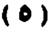

		  3: «footnote1»          accuracy=0.8, connectBorder=4


		  4: «footnote2»          accuracy=0.8, connectBorder=4


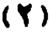

		  5: «footnote3»          accuracy=0.8, connectBorder=4


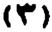

		  6: «footnote4»          accuracy=0.8, connectBorder=4


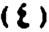

		  7: «footnote6»          accuracy=0.8, connectBorder=4


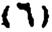

		  8: «footnote7»          accuracy=0.8, connectBorder=4


		  9: «footnote8»          accuracy=0.8, connectBorder=4


		 11: «shadda.a»           accuracy=0.8, connectBorder=4


		 10: «shadda.a.2»         accuracy=0.8, connectBorder=4


		 12: «u»                  accuracy=0.8, connectBorder=4


		 13: «un»                 accuracy=0.8, connectBorder=4


	band [low]
		 14: «a»                  accuracy=0.8, connectBorder=4


		 15: «dash»               accuracy=0.8, connectBorder=4


	band [mid]
		 16: «bracketClose»       accuracy=0.8, connectBorder=4


		 17: «bracketOpen»        accuracy=0.8, connectBorder=4


		 18: «colon»              accuracy=0.8, connectBorder=4


		 19: «comma»              accuracy=0.6, connectBorder=4


		 20: «guillemetClose»     accuracy=0.8, connectBorder=4


		 21: «guillemetOpen»      accuracy=0.8, connectBorder=4


		 22: «question»           accuracy=0.8, connectBorder=4


		 23: «semicolon»          accuracy=0.8, connectBorder=4


In [13]:
B.availableMarks()

Note the `shadda.a.2`, it has different settings. This has been achieved by adding
`(acc=0.7,cb=5)` to the file name of the image, right in front of the extension:

```shadda.a.2(acc=0.7,cb=5).png```

We can also customize the defaults and note that it does not override the settings obtained from the file name:

accuracy             = 0.3
connectBorder        = 8
Marks and their settings
	band [high]
		  1: «a»                  accuracy=0.3, connectBorder=8


		  2: «foonote5»           accuracy=0.3, connectBorder=8


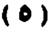

		  3: «footnote1»          accuracy=0.3, connectBorder=8


		  4: «footnote2»          accuracy=0.3, connectBorder=8


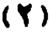

		  5: «footnote3»          accuracy=0.3, connectBorder=8


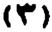

		  6: «footnote4»          accuracy=0.3, connectBorder=8


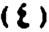

		  7: «footnote6»          accuracy=0.3, connectBorder=8


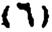

		  8: «footnote7»          accuracy=0.3, connectBorder=8


		  9: «footnote8»          accuracy=0.3, connectBorder=8


		 11: «shadda.a»           accuracy=0.3, connectBorder=8


		 10: «shadda.a.2»         accuracy=0.3, connectBorder=8


		 12: «u»                  accuracy=0.3, connectBorder=8


		 13: «un»                 accuracy=0.3, connectBorder=8


	band [low]
		 14: «a»                  accuracy=0.3, connectBorder=8


		 15: «dash»               accuracy=0.3, connectBorder=8


	band [mid]
		 16: «bracketClose»       accuracy=0.3, connectBorder=8


		 17: «bracketOpen»        accuracy=0.3, connectBorder=8


		 18: «colon»              accuracy=0.3, connectBorder=8


		 19: «comma»              accuracy=0.6, connectBorder=8


		 20: «guillemetClose»     accuracy=0.3, connectBorder=8


		 21: «guillemetOpen»      accuracy=0.3, connectBorder=8


		 22: «question»           accuracy=0.3, connectBorder=8


		 23: «semicolon»          accuracy=0.3, connectBorder=8


In [14]:
B.configure(accuracy=0.3, connectBorder=8)
B.showSettings(params="accuracy,connectBorder")
B.availableMarks()

We change it back:

accuracy             = 0.8
connectBorder        = 4
Marks and their settings
	band [high]
		  1: «a»                  accuracy=0.8, connectBorder=4


		  2: «foonote5»           accuracy=0.8, connectBorder=4


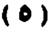

		  3: «footnote1»          accuracy=0.8, connectBorder=4


		  4: «footnote2»          accuracy=0.8, connectBorder=4


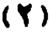

		  5: «footnote3»          accuracy=0.8, connectBorder=4


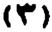

		  6: «footnote4»          accuracy=0.8, connectBorder=4


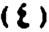

		  7: «footnote6»          accuracy=0.8, connectBorder=4


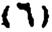

		  8: «footnote7»          accuracy=0.8, connectBorder=4


		  9: «footnote8»          accuracy=0.8, connectBorder=4


		 11: «shadda.a»           accuracy=0.8, connectBorder=4


		 10: «shadda.a.2»         accuracy=0.8, connectBorder=4


		 12: «u»                  accuracy=0.8, connectBorder=4


		 13: «un»                 accuracy=0.8, connectBorder=4


	band [low]
		 14: «a»                  accuracy=0.8, connectBorder=4


		 15: «dash»               accuracy=0.8, connectBorder=4


	band [mid]
		 16: «bracketClose»       accuracy=0.8, connectBorder=4


		 17: «bracketOpen»        accuracy=0.8, connectBorder=4


		 18: «colon»              accuracy=0.8, connectBorder=4


		 19: «comma»              accuracy=0.6, connectBorder=4


		 20: «guillemetClose»     accuracy=0.8, connectBorder=4


		 21: «guillemetOpen»      accuracy=0.8, connectBorder=4


		 22: «question»           accuracy=0.8, connectBorder=4


		 23: «semicolon»          accuracy=0.8, connectBorder=4


In [15]:
B.configure(accuracy=None, connectBorder=None)
B.showSettings(params="accuracy,connectBorder")
B.availableMarks()

# Pages

The input of the processing line are the scanned pages in the `in` directory.

Let's see what pages we have:

In [16]:
B.availablePages()

 2m 13s 6 pages: 47-48,58-59,63,67


The easiest thing is to run all pages:

In [17]:
lastPage = B.process()

  0.00s Batch of 6 pages: 47-48,58-59,63,67
  0.00s Start batch processing images
   |     0.69s     1 047.tif                                   66%
   |     0.77s     2 048.tif                                   73%
   |     0.83s     3 058.tif                                   77%
   |     0.72s     4 059.tif                                   76%
   |     0.73s     5 063.tif                                   74%
   |     0.71s     6 067.tif                                   75%
  4.46s all done
   |     0.00s Start batch OCR of all clean images
   |       19s OCR done
    23s all done


The pipeline returns the last page as the result of the operation.

All pages are logged, with timing and with the percentage of the height of the page at which the footnote mark has been found.

You can also do a selection of pages (and we skip the time consuming OCR step here):

In [18]:
lastPage = B.process(pages="48-60,67", doOcr=False)

  0.00s Batch of 4 pages: 48,58-59,67
  0.00s Start batch processing images
   |     0.78s     1 048.tif                                   73%
   |     0.81s     2 058.tif                                   77%
   |     0.75s     3 059.tif                                   76%
   |     0.72s     4 067.tif                                   75%
  3.06s all done
  3.06s all done


## Inspection

It is possible to have a closer look.
Let's focus on a single page.

We pass a parameter to turn batch mode off. This will preserve intermediate results, which we can then
inspect.

OCR is included.

In [19]:
page = B.process(batch=False, pages='47')

  0.00s Batch of 1 pages: 47
  0.00s Start batch processing images
   |     3.97s     1 047.tif                                   66%
  3.98s all done
  3.98s all done


### Inspect intermediate stages

Let's show all stages, but heavily reduced:

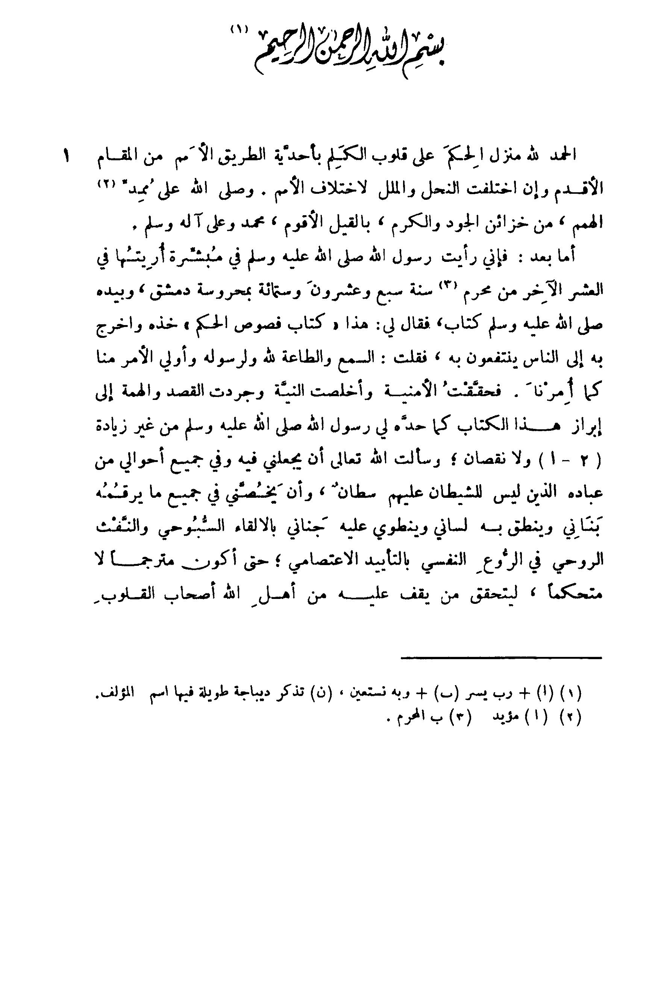

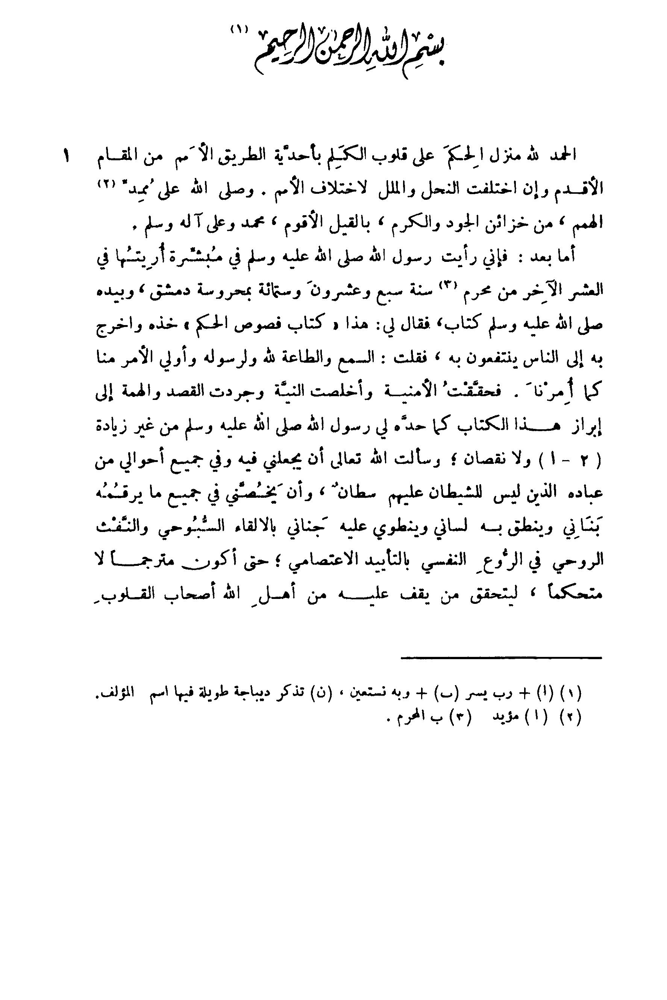

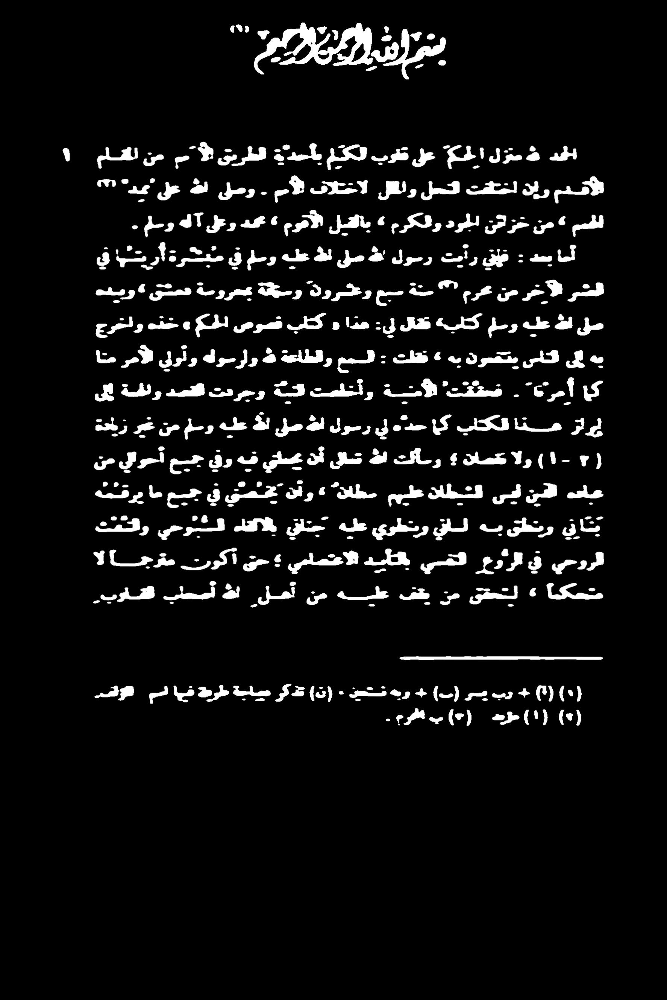

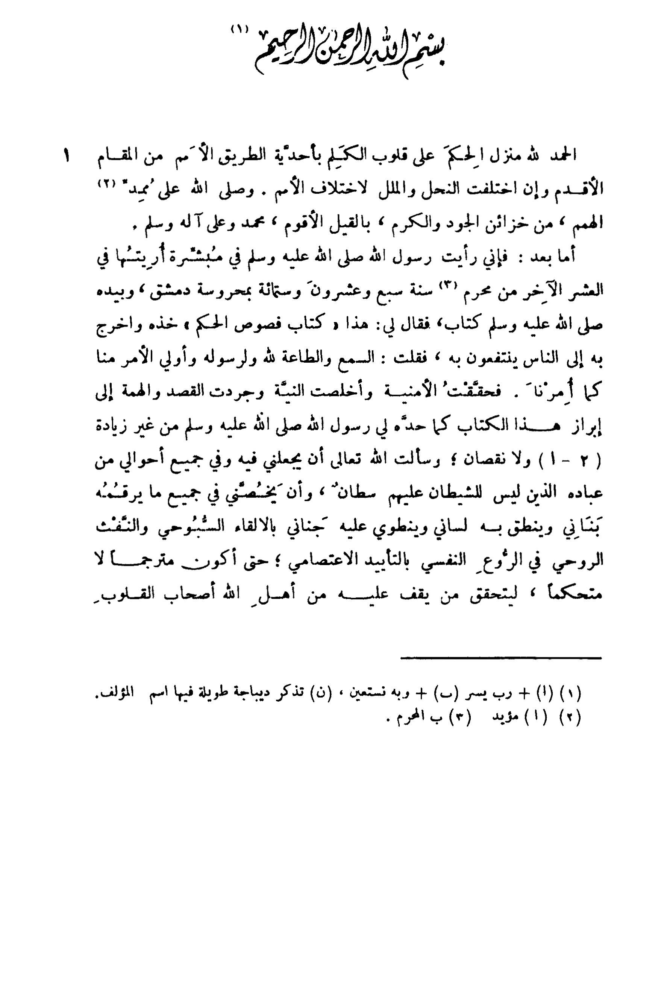

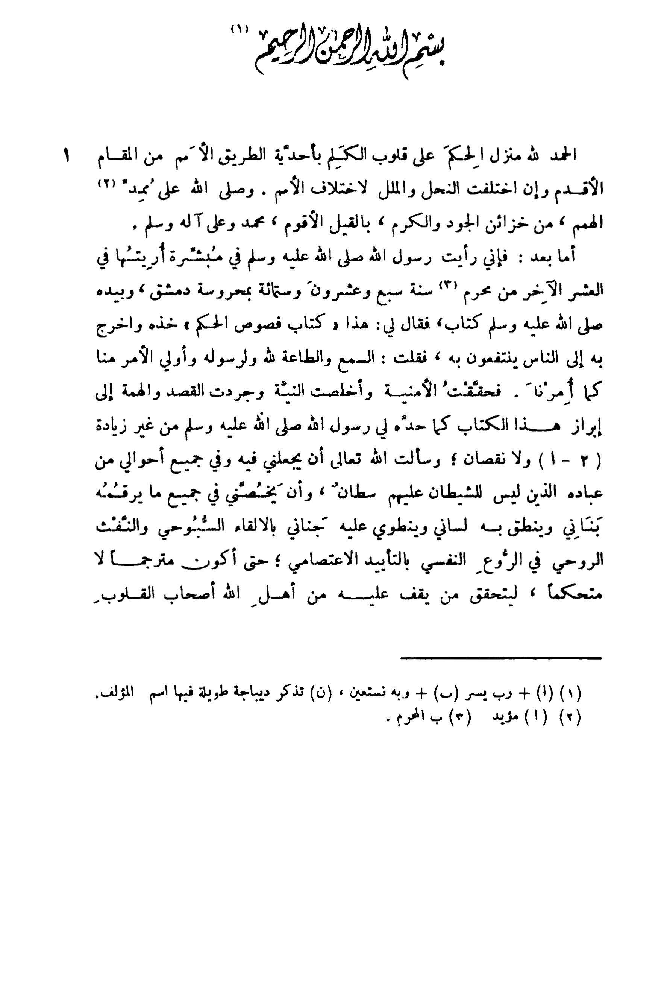

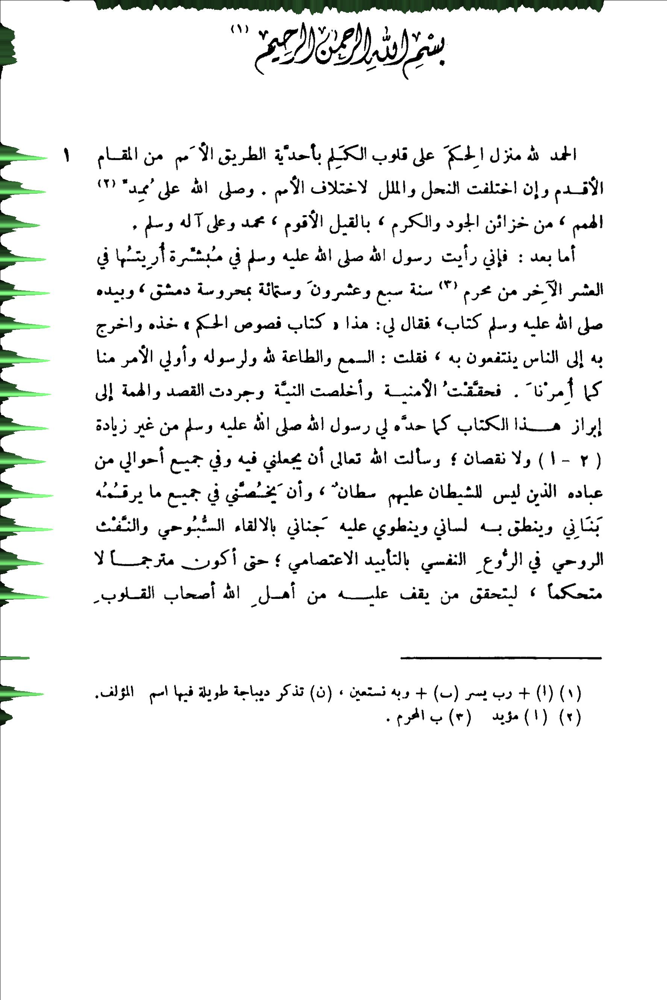

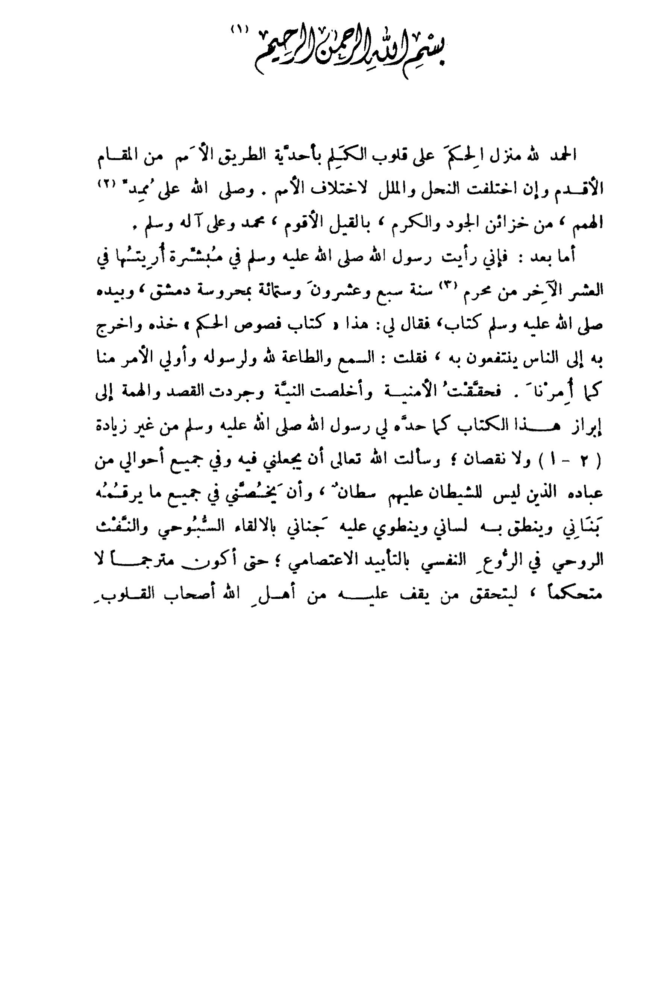

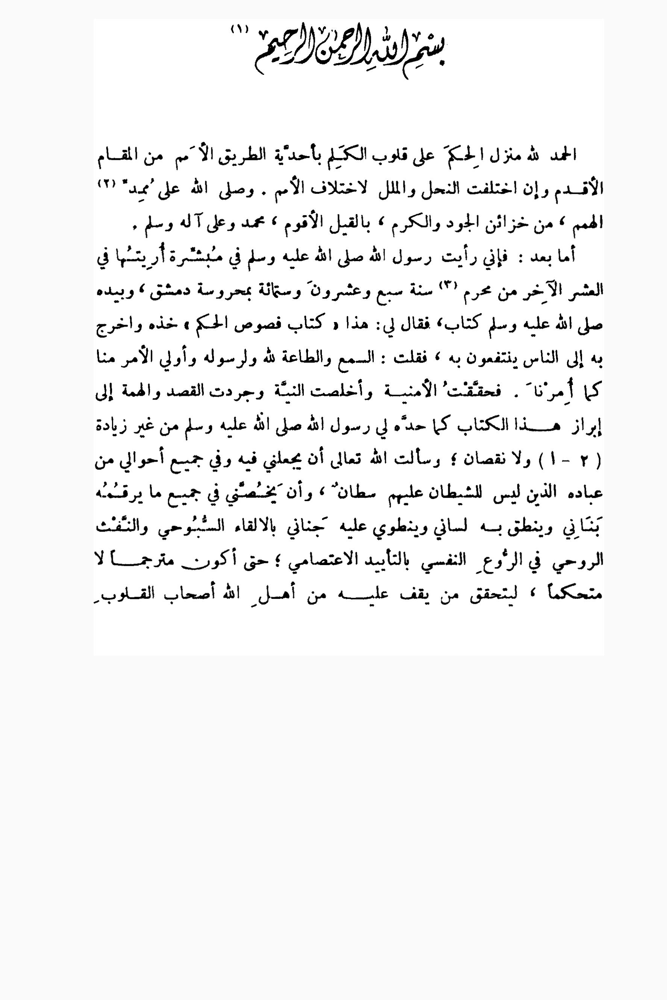

high


   |    1: a                    wiped    9 x, kept    8 x
   |                            kept     8 x
   |      |   wiped tblr= 382  395  899  920, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr= 743  756  812  833, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr=1369 1382 1554 1575, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr=1282 1295  733  754, value= 0.92 conn=0.000 border= 4
   |      |   wiped tblr=1370 1383  853  874, value= 0.93 conn=0.000 border= 4
   |      |   wiped tblr=1013 1026 1396 1417, value= 0.94 conn=0.000 border= 4
   |      |   wiped tblr= 385  398  501  522, value= 0.94 conn=0.000 border= 4
   |      |   wiped tblr=1370 1383 1584 1605, value= 0.96 conn=0.000 border= 4
   |      |   wiped tblr= 383  396 1177 1198, value= 0.96 conn=0.000 border= 4
   |      |   kept  tblr= 569  582 1085 1106, value= 0.81 conn=0.612 border= 4
   |      |   kept  tblr=1099 1112 1180 1201, value= 0.81 conn=0.344 border= 4
   |      |   kept  tblr= 82

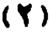

   |    4: footnote2            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 470  503  258  310, value= 0.87 conn=0.000 border= 4


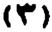

   |    5: footnote3            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 742  774 1165 1217, value= 0.92 conn=0.000 border= 4


   |    8: footnote7            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 472  503  258  307, value= 0.81 conn=0.000 border= 4


   |   10: shadda.a.2           wiped    8 x, kept    1 x
   |                            kept     1 x
   |      |   wiped tblr= 472  490  325  341, value= 0.82 conn=0.000 border= 4
   |      |   wiped tblr= 654  672  505  521, value= 0.83 conn=0.056 border= 4
   |      |   wiped tblr= 382  400  753  769, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr=1100 1118 1067 1083, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr=1278 1296  635  651, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr=1009 1027  747  763, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr=1009 1027 1257 1273, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr=1367 1385  322  338, value= 0.93 conn=0.000 border= 4
   |      |   kept  tblr= 463  481  775  791, value= 0.81 conn=0.181 border= 4


   |   11: shadda.a             wiped   14 x, kept    5 x
   |                            kept     5 x
   |      |   wiped tblr= 567  585 1321 1337, value= 0.81 conn=0.000 border= 4
   |      |   wiped tblr= 750  768  924  940, value= 0.82 conn=0.000 border= 4
   |      |   wiped tblr=1289 1307 1239 1255, value= 0.83 conn=0.000 border= 4
   |      |   wiped tblr=1383 1401  268  284, value= 0.84 conn=0.000 border= 4
   |      |   wiped tblr= 751  769 1552 1568, value= 0.84 conn=0.000 border= 4
   |      |   wiped tblr= 473  491  325  341, value= 0.86 conn=0.000 border= 4
   |      |   wiped tblr= 751  769  441  457, value= 0.87 conn=0.000 border= 4
   |      |   wiped tblr=1010 1028  747  763, value= 0.87 conn=0.000 border= 4
   |      |   wiped tblr= 661  679  522  538, value= 0.88 conn=0.056 border= 4
   |      |   wiped tblr=1101 1119 1067 1083, value= 0.89 conn=0.000 border= 4
   |      |   wiped tblr=1009 1027 1258 1274, value= 0.91 conn=0.056 border= 4
   |      |   wiped tblr=127

   |   12: u                    wiped    8 x, kept    1 x
   |                            kept     1 x
   |      |   wiped tblr=1010 1030 1177 1191, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr=1277 1297  683  697, value= 0.93 conn=0.000 border= 4
   |      |   wiped tblr= 470  490  399  413, value= 0.94 conn=0.000 border= 4
   |      |   wiped tblr= 650  670  338  352, value= 0.94 conn=0.000 border= 4
   |      |   wiped tblr=1368 1388  511  525, value= 0.95 conn=0.000 border= 4
   |      |   wiped tblr=1278 1298  302  316, value= 0.95 conn=0.000 border= 4
   |      |   wiped tblr= 650  670  562  576, value= 0.95 conn=0.000 border= 4
   |      |   wiped tblr=1277 1297  273  287, value= 0.96 conn=0.000 border= 4
   |      |   kept  tblr=1278 1298  888  902, value= 0.85 conn=0.200 border= 4


   |   13: un                   wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr=1276 1300  880  901, value= 0.92 conn=0.000 border= 4
low


   |   14: a                    wiped    3 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr=1064 1082 1498 1518, value= 0.89 conn=0.000 border= 4
   |      |   wiped tblr=1601 1619  666  686, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr= 524  542  367  387, value= 0.92 conn=0.000 border= 4
mid


   |   18: colon                wiped    3 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 935  971 1014 1028, value= 0.89 conn=0.000 border= 4
   |      |   wiped tblr= 845  881 1000 1014, value= 0.93 conn=0.000 border= 4
   |      |   wiped tblr= 666  702 1379 1393, value= 0.95 conn=0.000 border= 4


   |   19: comma                wiped   14 x, kept   92 x
   |                            kept    92 x
   |      |   wiped tblr=1383 1424 1278 1295, value= 0.65 conn=0.098 border= 4
   |      |   wiped tblr=1297 1338 1512 1529, value= 0.65 conn=0.098 border= 4
   |      |   wiped tblr=1118 1159 1049 1066, value= 0.67 conn=0.000 border= 4
   |      |   wiped tblr=1385 1426  625  642, value= 0.67 conn=0.000 border= 4
   |      |   wiped tblr= 849  890  886  903, value= 0.68 conn=0.000 border= 4
   |      |   wiped tblr= 574  615 1486 1503, value= 0.68 conn=0.000 border= 4
   |      |   wiped tblr= 933  974 1155 1172, value= 0.71 conn=0.000 border= 4
   |      |   wiped tblr= 843  884 1161 1178, value= 0.71 conn=0.000 border= 4
   |      |   wiped tblr= 574  615 1005 1022, value= 0.72 conn=0.000 border= 4
   |      |   wiped tblr=1200 1241 1199 1216, value= 0.74 conn=0.000 border= 4
   |      |   wiped tblr=1468 1509  731  748, value= 0.75 conn=0.000 border= 4
   |      |   wiped tblr= 84

   |   21: guillemetOpen        wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 843  890  883  903, value= 0.82 conn=0.000 border= 4


   |   23: semicolon            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr=1468 1516  729  747, value= 0.83 conn=0.000 border= 4


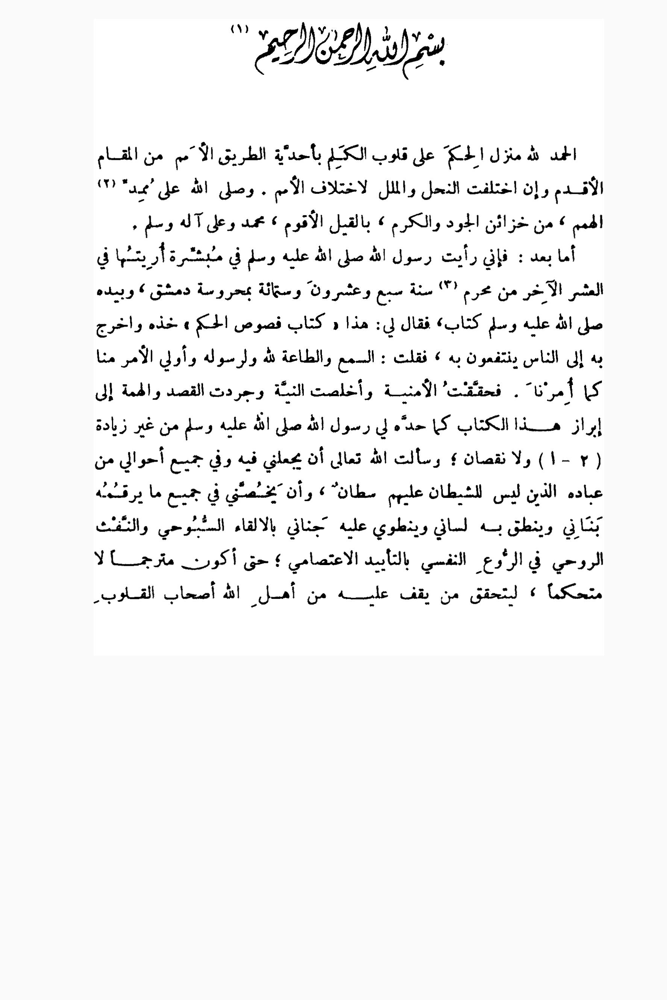

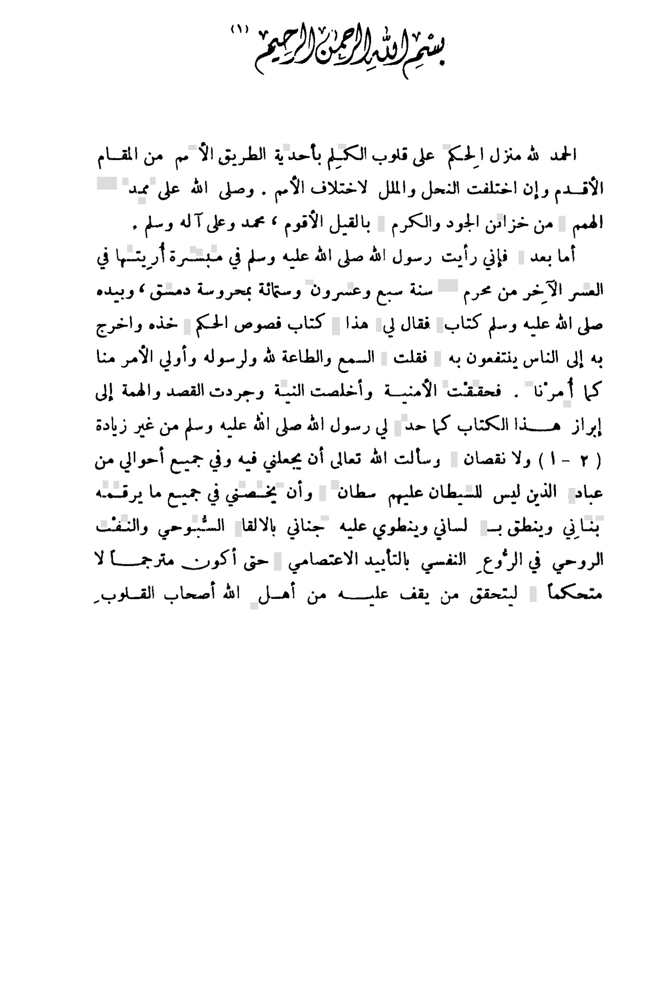

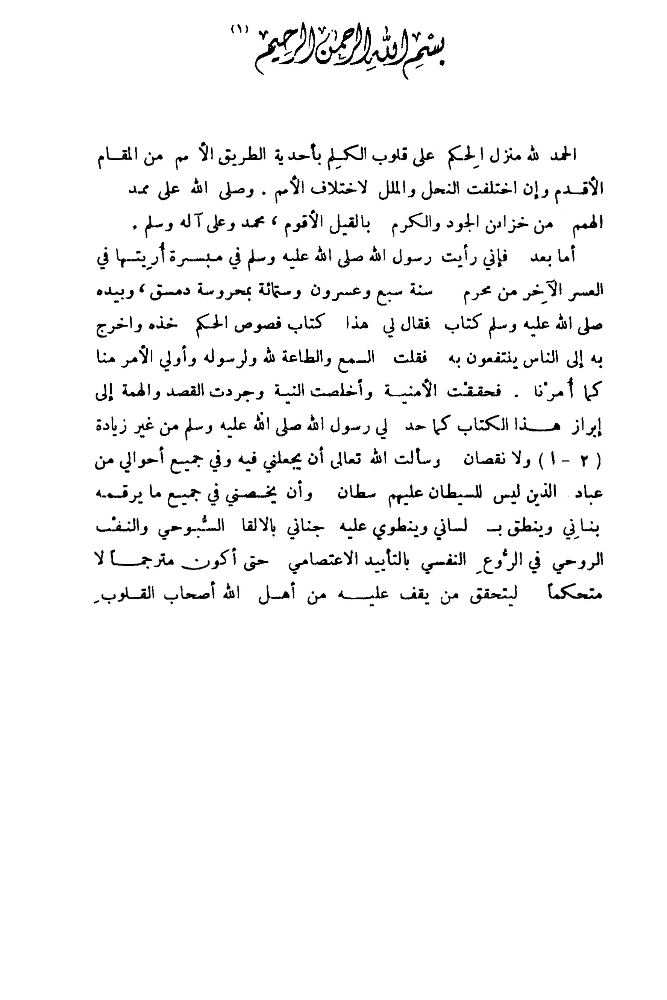

   |      |   'level\tpage_num\tblock_num\tpar_num\tline_num\tword_num\tleft\ttop\twidth\theight\tconf\ttext\n1\t1\t0\t0\t0\t0\t0\t0\t1774\t2658\t-1\t\n2\t1\t1\t0\t0\t0\t614\t59\t569\t153\t-1\t\n3\t1\t1\t1\t0\t0\t614\t59\t569\t153\t-1\t\n4\t1\t1\t1\t1\t0\t614\t59\t569\t153\t-1\t\n5\t1\t1\t1\t1\t1\t1003\t48\t180\t185\t9\tبتريث\n5\t1\t1\t1\t1\t2\t841\t59\t160\t131\t27\tإلية\n5\t1\t1\t1\t1\t3\t677\t59\t161\t140\t29\tايي\n5\t1\t1\t1\t1\t4\t614\t64\t43\t25\t82\t"\n2\t1\t2\t0\t0\t0\t249\t377\t1355\t1235\t-1\t\n3\t1\t2\t1\t0\t0\t261\t377\t1343\t257\t-1\t\n4\t1\t2\t1\t1\t0\t261\t377\t1271\t76\t-1\t\n5\t1\t2\t1\t1\t1\t1465\t387\t67\t40\t47\tاجلد\n5\t1\t2\t1\t1\t2\t1403\t385\t30\t42\t92\tهلل\n5\t1\t2\t1\t1\t3\t1304\t392\t82\t43\t41\tمتل\n5\t1\t2\t1\t1\t4\t1193\t385\t92\t66\t68\tاجلـع\n5\t1\t2\t1\t1\t5\t1099\t392\t56\t51\t89\tعىل\n5\t1\t2\t1\t1\t6\t991\t391\t92\t48\t93\tقلوب\n5\t1\t2\t1\t1\t7\t872\t384\t102\t69\t50\tالكم\n5\t1\t2\t1\t1\t8\t732\t381\t122\t58\t90\tبأحدية\n5\t1\t2\t1\t1\t9\t582\t387

In [21]:
page.show(width=200)

Note the data stages:

*    `markData` with the cleaning data.
*    `ocrData` with the OCR data.

Now the histogram and the cleanh stage at true size;

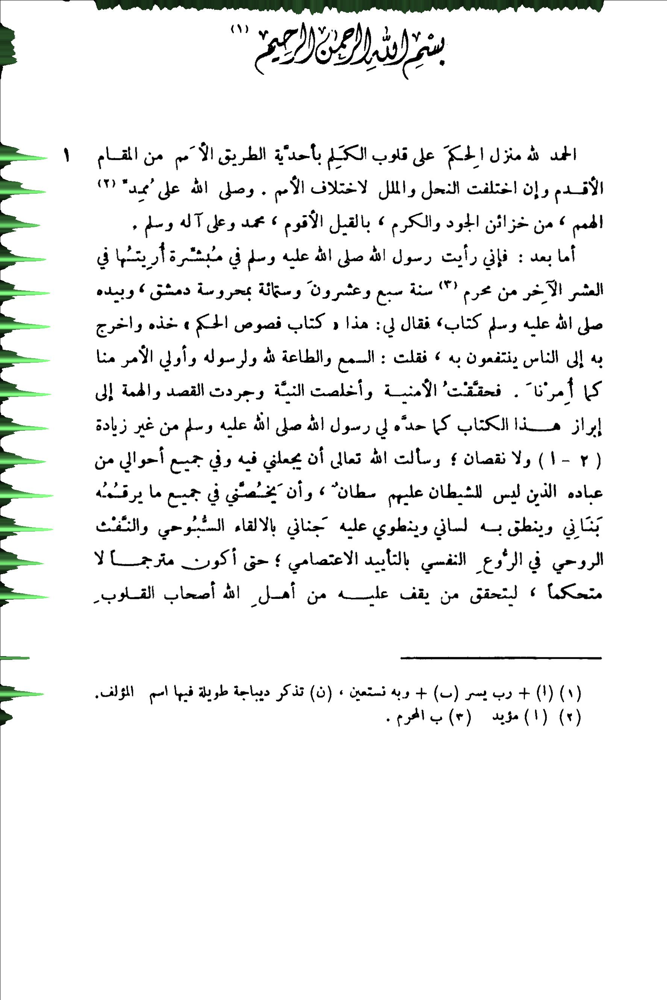

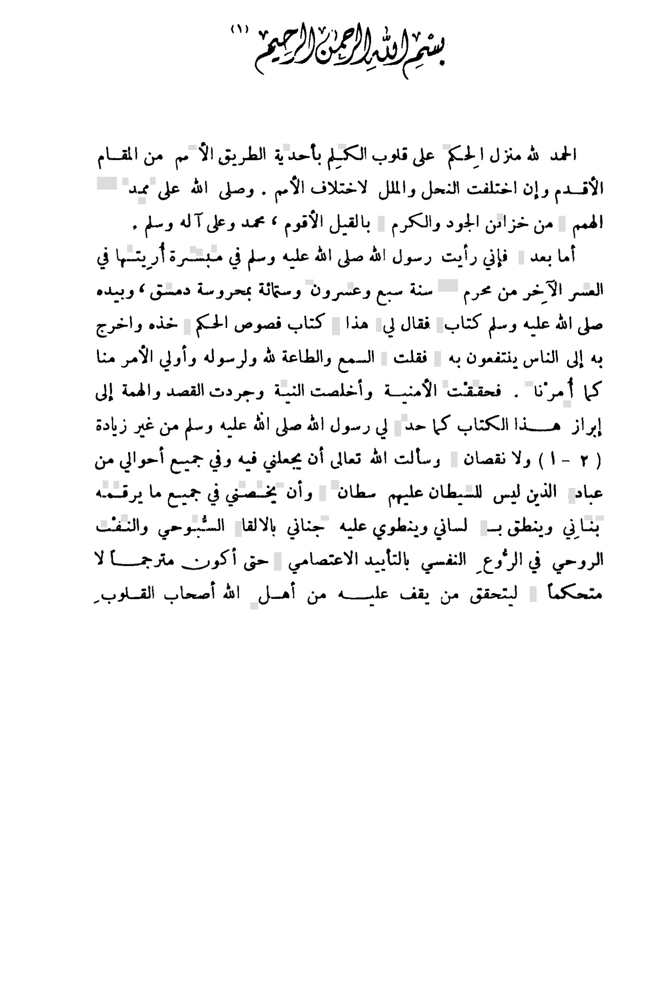

In [22]:
page.show(stage='histogram,cleanh')

The grey rectangles are the traces of wiped marks.

But what goes to the OCR engine is stage `clean`:

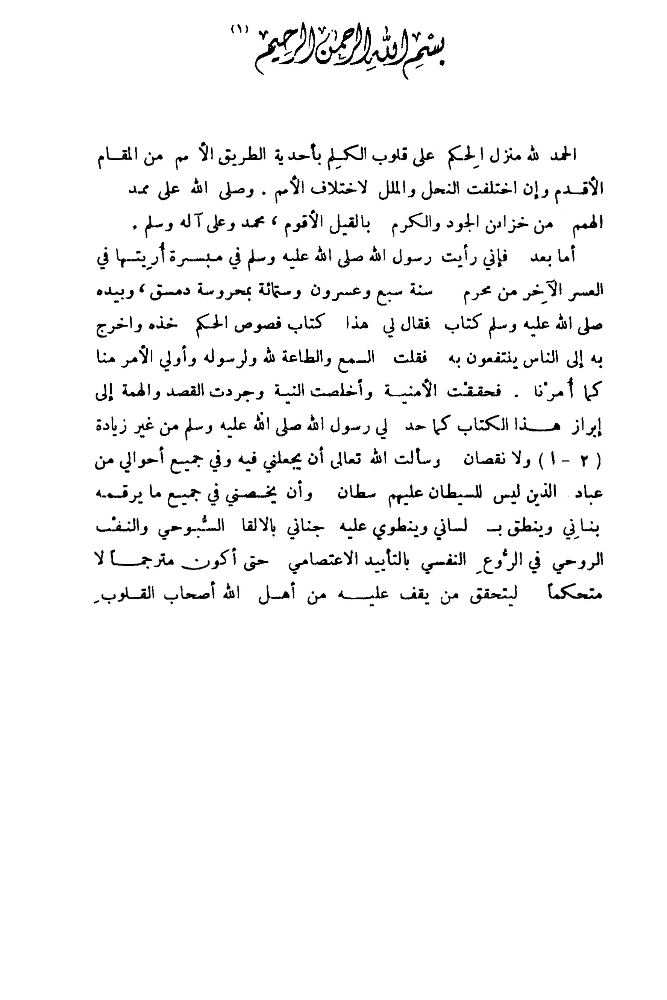

In [23]:
page.show(stage='clean')

### Inspect bands

Let's have a look at all the bands.

We project the bands on the histogram of the page.

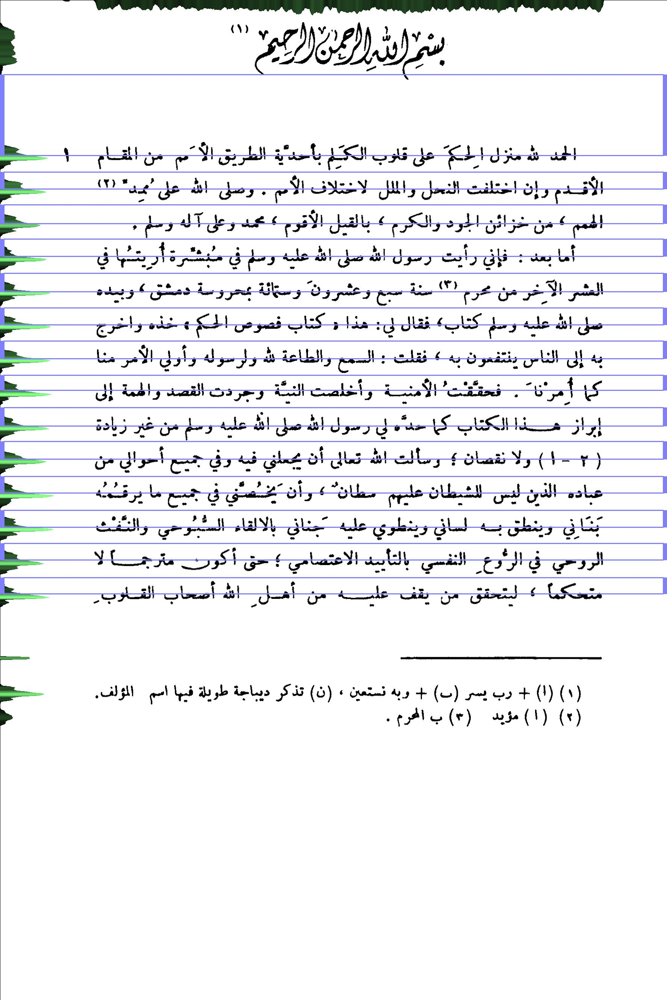

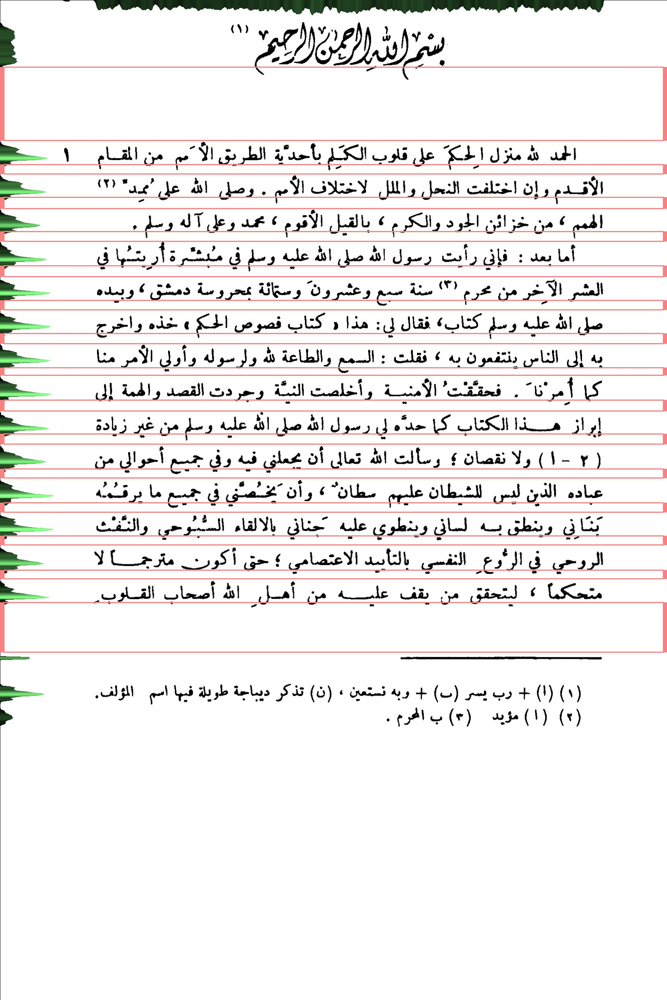

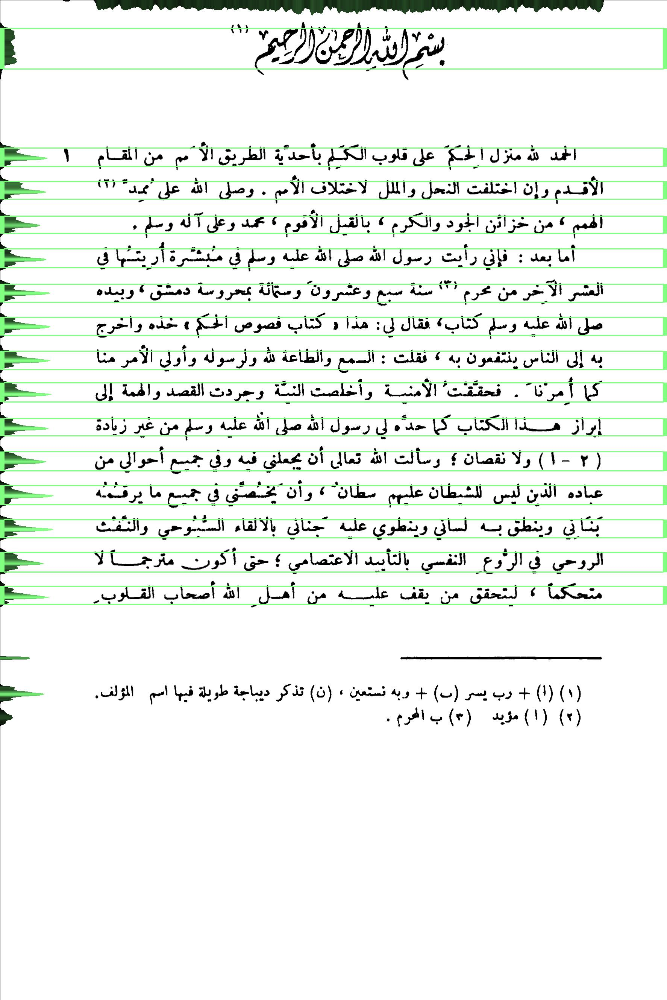

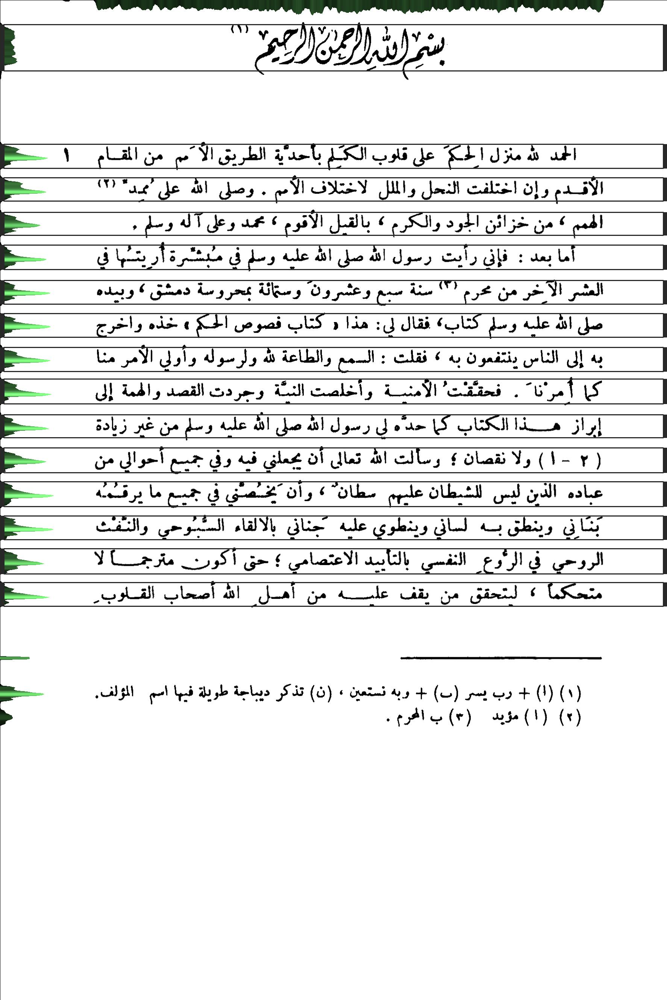

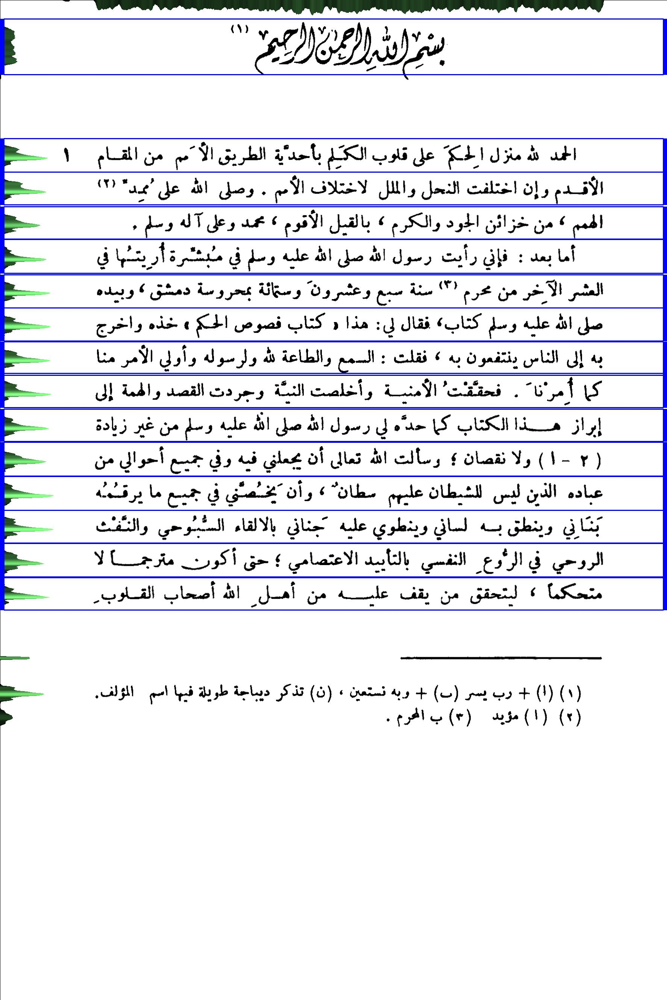

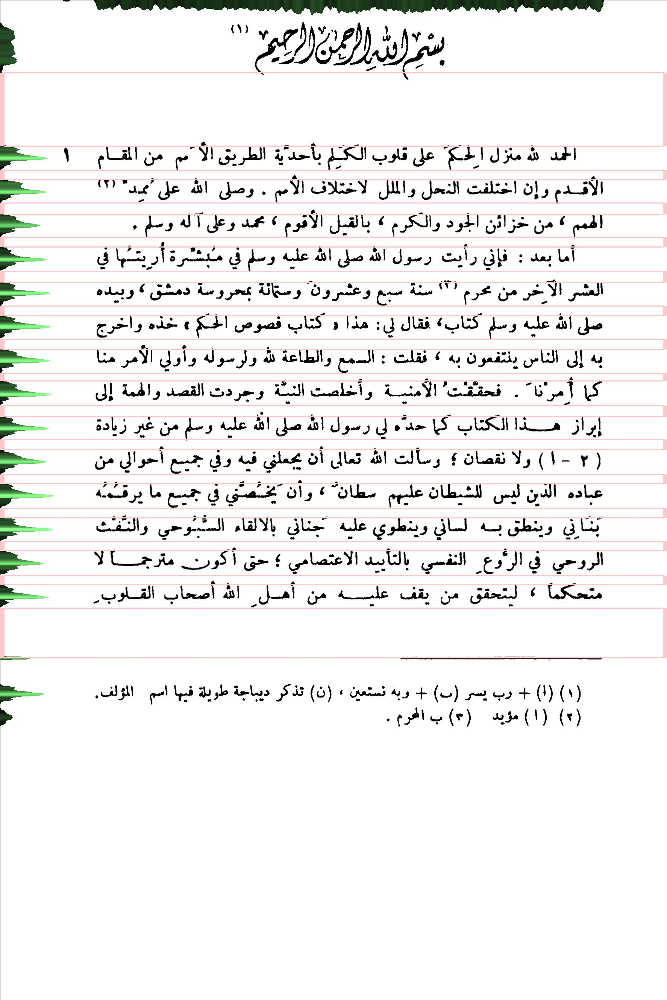

In [24]:
for doBands in ("high", "low", "mid", "main", "broad", "inter"):
    page.show(stage="histogram", band=doBands)

We can also show several bands together:

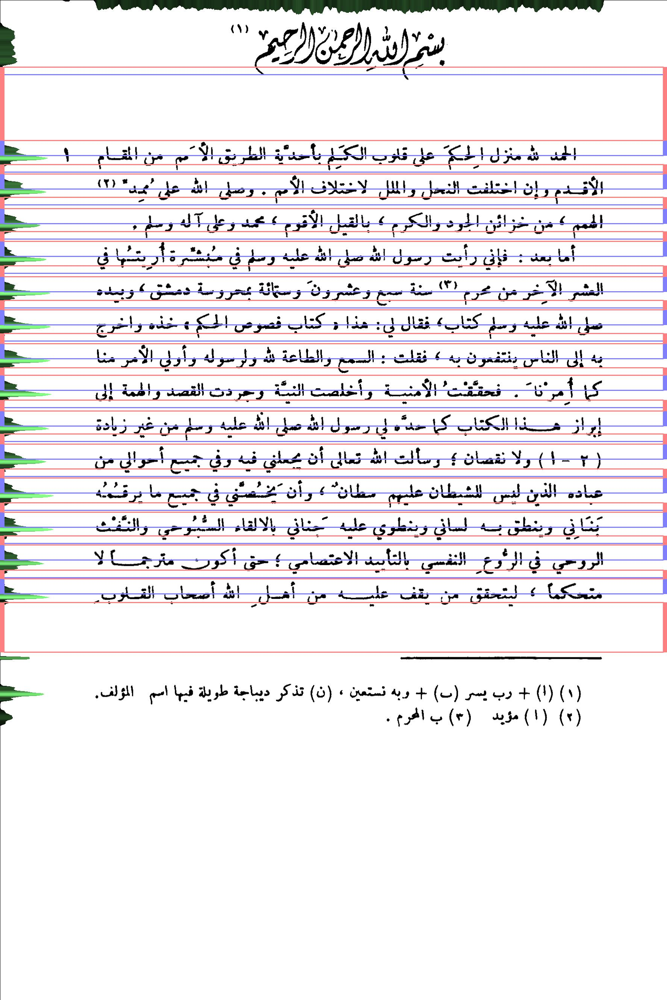

In [25]:
page.show(stage="histogram", band="low,high")

# Cleaning

Proper cleaning requires some interactive adjusting of parameters.
So we need feedback as to what marks have been cleaned and why.

## Connectedness

We can use the `boxed` stage to inspect the results of cleaning.

The letters above the boxes refer to the bands in which those marks are searched:

letter | band
--- | ---
` ` | main
`l` | low
`m` | mid
`h` | high
`b` | broad
`i` | inter

The numbers above the boxes are the numbers of the marks, by running `B.availableMarks()` you see the marks with their numbers.

Marks in *green* boxes will not be removed. 
They are apparently part of a letter, not an isolated blob of ink.

The algorithm computes a degree of connection, and if that is bigger than 0.1, the mark counts as connected.
The connection degrees are printed below the marks (times 100), so 10 is the cutoff value. 
Green marks are always higher than 10.

Marks in *orange* boxes will be removed. 
They have a small connection degree, less than 0.1, but usually much smaller. If it is near zero, it will be left out.

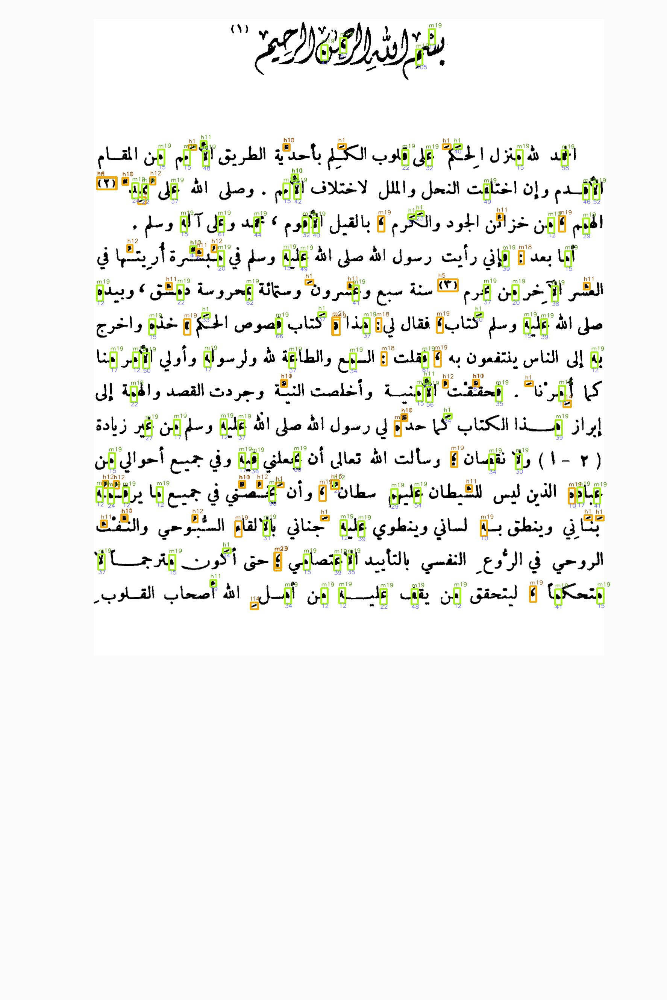

In [30]:
page.show(stage='boxed')

We can also ask for a log of the cleaning process which gives a bit more information:

high


   |    1: a                    wiped    9 x, kept    8 x
   |                            kept     8 x
   |      |   wiped tblr= 382  395  899  920, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr= 743  756  812  833, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr=1369 1382 1554 1575, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr=1282 1295  733  754, value= 0.92 conn=0.000 border= 4
   |      |   wiped tblr=1370 1383  853  874, value= 0.93 conn=0.000 border= 4
   |      |   wiped tblr=1013 1026 1396 1417, value= 0.94 conn=0.000 border= 4
   |      |   wiped tblr= 385  398  501  522, value= 0.94 conn=0.000 border= 4
   |      |   wiped tblr=1370 1383 1584 1605, value= 0.96 conn=0.000 border= 4
   |      |   wiped tblr= 383  396 1177 1198, value= 0.96 conn=0.000 border= 4
   |      |   kept  tblr= 569  582 1085 1106, value= 0.81 conn=0.612 border= 4
   |      |   kept  tblr=1099 1112 1180 1201, value= 0.81 conn=0.344 border= 4
   |      |   kept  tblr= 82

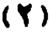

   |    4: footnote2            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 470  503  258  310, value= 0.87 conn=0.000 border= 4


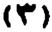

   |    5: footnote3            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 742  774 1165 1217, value= 0.92 conn=0.000 border= 4


   |    8: footnote7            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 472  503  258  307, value= 0.81 conn=0.000 border= 4


   |   10: shadda.a.2           wiped    8 x, kept    1 x
   |                            kept     1 x
   |      |   wiped tblr= 472  490  325  341, value= 0.82 conn=0.000 border= 4
   |      |   wiped tblr= 654  672  505  521, value= 0.83 conn=0.056 border= 4
   |      |   wiped tblr= 382  400  753  769, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr=1100 1118 1067 1083, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr=1278 1296  635  651, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr=1009 1027  747  763, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr=1009 1027 1257 1273, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr=1367 1385  322  338, value= 0.93 conn=0.000 border= 4
   |      |   kept  tblr= 463  481  775  791, value= 0.81 conn=0.181 border= 4


   |   11: shadda.a             wiped   14 x, kept    5 x
   |                            kept     5 x
   |      |   wiped tblr= 567  585 1321 1337, value= 0.81 conn=0.000 border= 4
   |      |   wiped tblr= 750  768  924  940, value= 0.82 conn=0.000 border= 4
   |      |   wiped tblr=1289 1307 1239 1255, value= 0.83 conn=0.000 border= 4
   |      |   wiped tblr=1383 1401  268  284, value= 0.84 conn=0.000 border= 4
   |      |   wiped tblr= 751  769 1552 1568, value= 0.84 conn=0.000 border= 4
   |      |   wiped tblr= 473  491  325  341, value= 0.86 conn=0.000 border= 4
   |      |   wiped tblr= 751  769  441  457, value= 0.87 conn=0.000 border= 4
   |      |   wiped tblr=1010 1028  747  763, value= 0.87 conn=0.000 border= 4
   |      |   wiped tblr= 661  679  522  538, value= 0.88 conn=0.056 border= 4
   |      |   wiped tblr=1101 1119 1067 1083, value= 0.89 conn=0.000 border= 4
   |      |   wiped tblr=1009 1027 1258 1274, value= 0.91 conn=0.056 border= 4
   |      |   wiped tblr=127

   |   12: u                    wiped    8 x, kept    1 x
   |                            kept     1 x
   |      |   wiped tblr=1010 1030 1177 1191, value= 0.90 conn=0.000 border= 4
   |      |   wiped tblr=1277 1297  683  697, value= 0.93 conn=0.000 border= 4
   |      |   wiped tblr= 470  490  399  413, value= 0.94 conn=0.000 border= 4
   |      |   wiped tblr= 650  670  338  352, value= 0.94 conn=0.000 border= 4
   |      |   wiped tblr=1368 1388  511  525, value= 0.95 conn=0.000 border= 4
   |      |   wiped tblr=1278 1298  302  316, value= 0.95 conn=0.000 border= 4
   |      |   wiped tblr= 650  670  562  576, value= 0.95 conn=0.000 border= 4
   |      |   wiped tblr=1277 1297  273  287, value= 0.96 conn=0.000 border= 4
   |      |   kept  tblr=1278 1298  888  902, value= 0.85 conn=0.200 border= 4


   |   13: un                   wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr=1276 1300  880  901, value= 0.92 conn=0.000 border= 4
low


   |   14: a                    wiped    3 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr=1064 1082 1498 1518, value= 0.89 conn=0.000 border= 4
   |      |   wiped tblr=1601 1619  666  686, value= 0.91 conn=0.000 border= 4
   |      |   wiped tblr= 524  542  367  387, value= 0.92 conn=0.000 border= 4
mid


   |   18: colon                wiped    3 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 935  971 1014 1028, value= 0.89 conn=0.000 border= 4
   |      |   wiped tblr= 845  881 1000 1014, value= 0.93 conn=0.000 border= 4
   |      |   wiped tblr= 666  702 1379 1393, value= 0.95 conn=0.000 border= 4


   |   19: comma                wiped   14 x, kept   92 x
   |                            kept    92 x
   |      |   wiped tblr=1383 1424 1278 1295, value= 0.65 conn=0.098 border= 4
   |      |   wiped tblr=1297 1338 1512 1529, value= 0.65 conn=0.098 border= 4
   |      |   wiped tblr=1118 1159 1049 1066, value= 0.67 conn=0.000 border= 4
   |      |   wiped tblr=1385 1426  625  642, value= 0.67 conn=0.000 border= 4
   |      |   wiped tblr= 849  890  886  903, value= 0.68 conn=0.000 border= 4
   |      |   wiped tblr= 574  615 1486 1503, value= 0.68 conn=0.000 border= 4
   |      |   wiped tblr= 933  974 1155 1172, value= 0.71 conn=0.000 border= 4
   |      |   wiped tblr= 843  884 1161 1178, value= 0.71 conn=0.000 border= 4
   |      |   wiped tblr= 574  615 1005 1022, value= 0.72 conn=0.000 border= 4
   |      |   wiped tblr=1200 1241 1199 1216, value= 0.74 conn=0.000 border= 4
   |      |   wiped tblr=1468 1509  731  748, value= 0.75 conn=0.000 border= 4
   |      |   wiped tblr= 84

   |   21: guillemetOpen        wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr= 843  890  883  903, value= 0.82 conn=0.000 border= 4


   |   23: semicolon            wiped    1 x, kept    0 x
   |                            kept     0 x
   |      |   wiped tblr=1468 1516  729  747, value= 0.83 conn=0.000 border= 4


In [31]:
page.show(stage='markData')

The starred entries correspond to the green boxes.

The connectivity times 100 is the number under the boxes.

Now we only want to see the effects of cleaning for specific marks (in specific bands):

acro,band,mark,hits
h1,high,a,17
m19,mid,comma,106


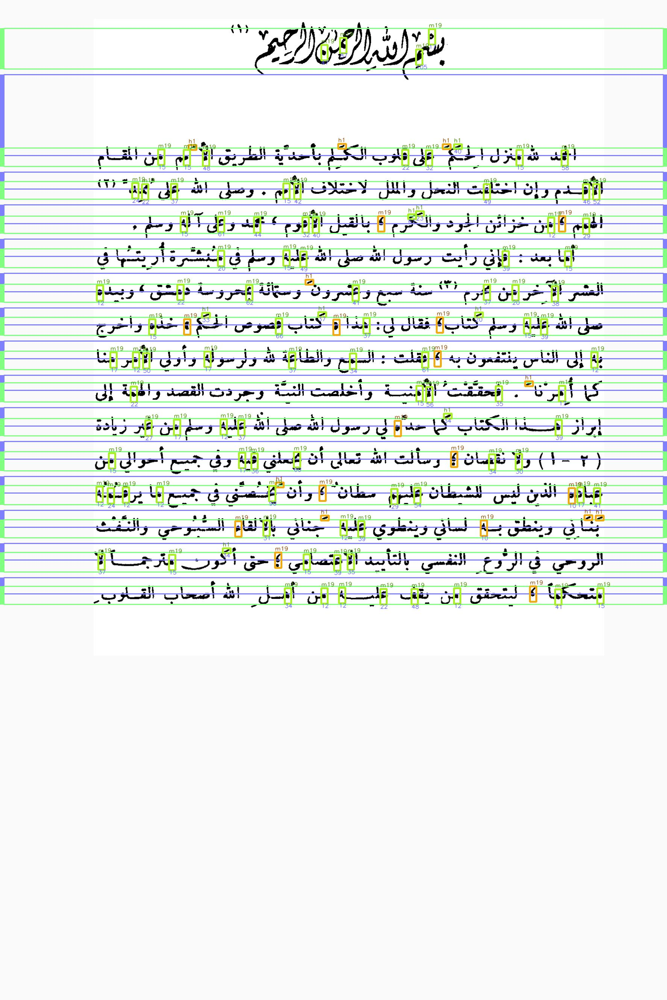

In [32]:
page.show(stage='boxed', band="high,mid", mark="comma,a")

## Cleaning parameters

The parameters that steer the cleaning process are

* `connectBorder`
* `connectRatio`
* `connectThreshold`

See the
[settings specs](https://among.github.io/fusus/parameters.html).